## Imports

In [1]:
import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.vision.gan import *
from fastai.torch_core import *

from torchvision.models import vgg16_bn
from ranger import *

In [2]:
from tensorboard import *
from tensorboard import GANSaveCallback
from fastai.vision.learner import cnn_config

In [3]:
torch.cuda.set_device(0)

In [4]:
path = Path('/home/jupyter/Colourize/')
path_colour = path/'tiny-imagenet-200/train'
path_crappy = path/'tiny-imagenet-200/BW'

In [5]:
bs,size=8, 128
sz=size
# bs,size = 24,160
#bs,size = 8,256
arch = models.resnet34

In [6]:
src = ImageImageList.from_folder(path_crappy).split_by_rand_pct(0.1, seed=42)

In [7]:
def get_data(bs,size, colour_path, crappy_path, keep_pct=0.8):
    src = (
        ImageImageList.from_folder(crappy_path, convert_mode='RGB')
        .use_partial_data(sample_pct=keep_pct, seed=42)
        .split_by_rand_pct(0.1, seed=42)
    )
    data = (
        src.label_from_func(lambda x: colour_path/x.relative_to(crappy_path))
    .transform( get_transforms(max_zoom=1.2, max_lighting=0.5, max_warp=0.25), size=size, tfm_y=True)
    .databunch(bs=bs, no_check=True)
    .normalize(imagenet_stats, do_y=True)
    )

    data.c = 3
    return data

In [8]:
data_gen = get_data(bs,size, colour_path=path_colour, crappy_path=path_crappy)

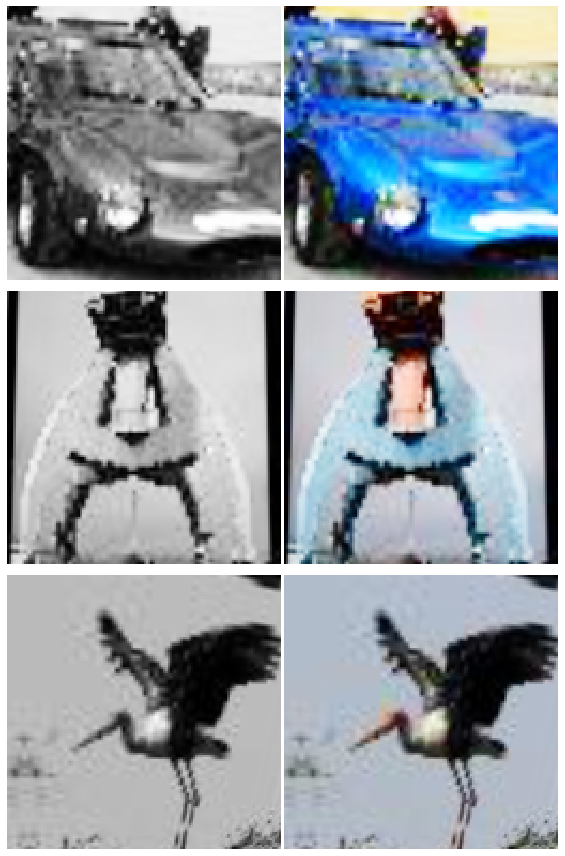

In [10]:
data_gen.show_batch(3, )

## Feature Loss

In [9]:
def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)

In [10]:
vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]

In [11]:
base_loss = F.l1_loss

class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()

In [12]:
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

## Mish

In [13]:
@torch.jit.script
def mish_jit_fwd(x):
    return x.mul(torch.tanh(F.softplus(x)))


@torch.jit.script
def mish_jit_bwd(x, grad_output):
    x_sigmoid = torch.sigmoid(x)
    x_tanh_sp = F.softplus(x).tanh()
    return grad_output.mul(x_tanh_sp + x * x_sigmoid * (1 - x_tanh_sp * x_tanh_sp))


class MishJitAutoFn(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x):
        ctx.save_for_backward(x)
        return mish_jit_fwd(x)

    @staticmethod
    def backward(ctx, grad_output):
        x = ctx.saved_tensors[0]
        return mish_jit_bwd(x, grad_output)


def mish_jit(x, inplace=False):
    # inplace ignored
    return MishJitAutoFn.apply(x)


class MishJit(nn.Module):
    def __init__(self, inplace: bool = False):
        super(MishJit, self).__init__()
        self.inplace = inplace

    def forward(self, x):
        return MishJitAutoFn.apply(x)

## Models

In [14]:
act_fn = MishJit()

class CustomPixelShuffle_ICNR(nn.Module):
    "Upsample by `scale` from `ni` filters to `nf` (default `ni`), using `nn.PixelShuffle`, `icnr` init, and `weight_norm`."

    def __init__(
        self,
        ni: int,
        nf: int = None,
        scale: int = 2,
        blur: bool = False,
        leaky: float = None,
        **kwargs
    ):
        super().__init__()
        nf = ifnone(nf, ni)
        self.conv = conv_layer_bn(
            ni, nf * (scale ** 2), ks=1, use_activ=False, **kwargs
        )
        icnr(self.conv[0].weight)
        self.shuf = nn.PixelShuffle(scale)
        # Blurring over (h*w) kernel
        # "Super-Resolution using Convolutional Neural Networks without Any Checkerboard Artifacts"
        # - https://arxiv.org/abs/1806.02658
        self.pad = nn.ReplicationPad2d((1, 0, 1, 0))
        self.blur = nn.AvgPool2d(2, stride=1)
        self.mish = act_fn
        self.relu = relu(True, leaky=leaky)

    def forward(self, x):
        x = self.shuf(self.mish(self.conv(x)))
        return self.blur(self.pad(x)) if self.blur else x

def conv_layer_bn(ni:int, nf:int, ks:int=3, stride:int=1, padding:int=None, bias:bool=None, is_1d:bool=False,
               norm_type:Optional[NormType]=NormType.Batch, use_activ:bool=True, extra_bn:bool=False,
               transpose:bool=False, leaky:float=None, init:Callable=nn.init.kaiming_normal_, self_attention:bool=False):
    "Create a sequence of convolutional (`ni` to `nf`), ReLU (if `use_activ`) and batchnorm (if `bn`) layers."
    if padding is None: padding = (ks-1)//2 if not transpose else 0
    bn = norm_type in (NormType.Batch, NormType.BatchZero) or extra_bn
    #print (bn)
    if bias is None: bias = not bn
    conv_func = nn.ConvTranspose2d if transpose else nn.Conv1d if is_1d else nn.Conv2d
    conv = init_default(conv_func(ni, nf, kernel_size=ks, bias=bias, stride=stride, padding=padding), init)
    if   norm_type==NormType.Weight:   conv = weight_norm(conv)
    elif norm_type==NormType.Spectral: conv = spectral_norm(conv)
    layers = [conv]
    #use mish
    if use_activ: layers.append(act_fn)
    if bn: layers.append((nn.BatchNorm1d if is_1d else nn.BatchNorm2d)(nf))
    if self_attention: layers.append(SelfAttention(nf))
    return nn.Sequential(*layers)

def conv_layer_mish(ni:int, nf:int, ks:int=3, stride:int=1, padding:int=None, bias:bool=None, is_1d:bool=False,
               norm_type:Optional[NormType]=NormType.Batch,  use_activ:bool=True, leaky:float=None,
               transpose:bool=False, init:Callable=nn.init.kaiming_normal_, self_attention:bool=False):
    "Create a sequence of convolutional (`ni` to `nf`), ReLU (if `use_activ`) and batchnorm (if `bn`) layers."
    if padding is None: padding = (ks-1)//2 if not transpose else 0
    bn = norm_type in (NormType.Batch, NormType.BatchZero)
    #print (bn)
    if bias is None: bias = not bn
    conv_func = nn.ConvTranspose2d if transpose else nn.Conv1d if is_1d else nn.Conv2d
    conv = init_default(conv_func(ni, nf, kernel_size=ks, bias=bias, stride=stride, padding=padding), init)
    if   norm_type==NormType.Weight:   conv = weight_norm(conv)
    elif norm_type==NormType.Spectral: conv = spectral_norm(conv)
    layers = [conv]
    #use mish
    if use_activ: layers.append(act_fn)
    if bn: layers.append((nn.BatchNorm1d if is_1d else nn.BatchNorm2d)(nf))
    if self_attention: layers.append(SelfAttention(nf))
    return nn.Sequential(*layers)

def _res_block(nf, dense:bool=False, norm_type:Optional[NormType]=NormType.Batch, bottle:bool=False, **conv_kwargs):
    "Resnet block of `nf` features. `conv_kwargs` are passed to `conv_layer`."
    norm2 = norm_type
    if not dense and (norm_type==NormType.Batch): norm2 = NormType.BatchZero
    nf_inner = nf//2 if bottle else nf
    return SequentialEx(conv_layer_bn(nf, nf_inner, norm_type=norm_type, **conv_kwargs),
                      conv_layer_bn(nf_inner, nf, norm_type=norm2, **conv_kwargs),
                      MergeLayer(dense))

In [15]:
def _get_sfs_idxs(sizes:Sizes) -> List[int]:
    "Get the indexes of the layers where the size of the activation changes."
    feature_szs = [size[-1] for size in sizes]
    sfs_idxs = list(np.where(np.array(feature_szs[:-1]) != np.array(feature_szs[1:]))[0])
    if feature_szs[0] != feature_szs[1]: sfs_idxs = [0] + sfs_idxs
    return sfs_idxs

class Custom_UnetBlock(Module):
    "A quasi-UNet block, using `PixelShuffle_ICNR upsampling`."
    def __init__(self, up_in_c:int, x_in_c:int, hook:Hook, final_div:bool=True, blur:bool=False, leaky:float=None,
                 self_attention:bool=False, **kwargs):
        self.hook = hook
        self.shuf = CustomPixelShuffle_ICNR(up_in_c, up_in_c//2, blur=blur, leaky=leaky, **kwargs)
        self.bn = batchnorm_2d(x_in_c)
        ni = up_in_c//2 + x_in_c
        nf = ni if final_div else ni//2
        self.conv1 = conv_layer_bn(ni, nf, leaky=leaky, **kwargs)
        self.conv2 = conv_layer_bn(nf, nf, leaky=leaky, self_attention=self_attention, **kwargs)
        self.relu = relu(leaky=leaky)
        self.mish = act_fn

    def forward(self, up_in:Tensor) -> Tensor:
        s = self.hook.stored
        up_out = self.shuf(up_in)
        ssh = s.shape[-2:]
        if ssh != up_out.shape[-2:]:
            up_out = F.interpolate(up_out, s.shape[-2:], mode='nearest')
        cat_x = self.mish(torch.cat([up_out, self.bn(s)], dim=1))
        return self.conv2(self.conv1(cat_x))


class DynamicUnet(SequentialEx):
    "Create a U-Net from a given architecture."
    def __init__(self, encoder:nn.Module, n_classes:int, img_size:Tuple[int,int]=(256,256), blur:bool=False, blur_final=True, self_attention:bool=False,
                 y_range:Optional[Tuple[float,float]]=None, norm_type: Optional[NormType] = NormType.Batch,
                 last_cross:bool=True, bottle:bool=False, **kwargs):
        imsize = img_size
        extra_bn = norm_type == NormType.Spectral
        sfs_szs = model_sizes(encoder, size=imsize)
        sfs_idxs = list(reversed(_get_sfs_idxs(sfs_szs)))
        self.sfs = hook_outputs([encoder[i] for i in sfs_idxs], detach=False)
        x = dummy_eval(encoder, imsize).detach()

        ni = sfs_szs[-1][1]
        middle_conv = nn.Sequential(conv_layer_bn(ni, ni*2, norm_type=norm_type, extra_bn=extra_bn, **kwargs),
                                    conv_layer_bn(ni*2, ni, norm_type=norm_type, extra_bn=extra_bn, **kwargs)).eval()
        x = middle_conv(x)
        #use mish
        layers = [encoder, batchnorm_2d(ni), act_fn, middle_conv]#nn.ReLU()

        for i,idx in enumerate(sfs_idxs):
            not_final = i!=len(sfs_idxs)-1
            up_in_c, x_in_c = int(x.shape[1]), int(sfs_szs[idx][1])
            do_blur = blur and (not_final or blur_final)
            sa = self_attention and (i==len(sfs_idxs)-3)
            unet_block = Custom_UnetBlock(up_in_c, x_in_c, self.sfs[i], norm_type=norm_type, extra_bn=extra_bn, final_div=not_final, blur=do_blur, self_attention=sa,
                                   **kwargs).eval()
            layers.append(unet_block)
            x = unet_block(x)

        ni = x.shape[1]
        if imsize != sfs_szs[0][-2:]: layers.append(CustomPixelShuffle_ICNR(ni, **kwargs))
        x = CustomPixelShuffle_ICNR(ni)(x)
        if imsize != x.shape[-2:]: layers.append(Lambda(lambda x: F.interpolate(x, imsize, mode='nearest')))
        if last_cross:
            layers.append(MergeLayer(dense=True))
            ni += in_channels(encoder)
            layers.append(_res_block(ni, bottle=bottle, norm_type=norm_type, **kwargs))
        layers += [conv_layer_bn(ni, n_classes, ks=1, use_activ=False, norm_type=norm_type, **kwargs)]
        if y_range is not None: layers.append(SigmoidRange(*y_range))
        super().__init__(*layers)

    def __del__(self):
        if hasattr(self, "sfs"): self.sfs.remove()

In [16]:
_conv_args = dict(leaky=0.2, norm_type=NormType.Spectral)

def _conv(ni:int, nf:int, ks:int=3, stride:int=1, **kwargs):
    return conv_layer_mish(ni, nf, ks=ks, stride=stride, **_conv_args, **kwargs)

def gan_critic(n_channels:int=3, nf:int=128, n_blocks:int=3, p:int=0.15):
    "Critic to train a `GAN`."
    layers = [
        _conv(n_channels, nf, ks=4, stride=2),
        nn.Dropout2d(p/2),
        _res_block(nf, dense=True,**_conv_args)]
    nf *= 2 # after dense block
    for i in range(n_blocks):
        layers += [
            nn.Dropout2d(p),
            _conv(nf, nf*2, ks=4, stride=2, self_attention=(i==0))]
        nf *= 2
    layers += [
        _conv(nf, 1, ks=4, bias=False, padding=0, use_activ=False),
        Flatten()]
    return nn.Sequential(*layers)

In [17]:
def unet_learner(data:DataBunch, arch:Callable, pretrained:bool=True, blur_final:bool=True,
                 norm_type:Optional[NormType]=NormType, split_on:Optional[SplitFuncOrIdxList]=None, blur:bool=False,
                 self_attention:bool=False, y_range:Optional[Tuple[float,float]]=None, last_cross:bool=True,
                 bottle:bool=False, cut:Union[int,Callable]=None, **learn_kwargs:Any)->Learner:
    "Build Unet learner from `data` and `arch`."
    meta = cnn_config(arch)
    body = create_body(arch, pretrained, cut)
    try:    size = data.train_ds[0][0].size
    except: size = next(iter(data.train_dl))[0].shape[-2:]
    model = to_device(DynamicUnet(body, n_classes=data.c, img_size=size, blur=blur, blur_final=blur_final,
          self_attention=self_attention, y_range=y_range, norm_type=norm_type, last_cross=last_cross,
          bottle=bottle), data.device)
    learn = Learner(data, model, **learn_kwargs)
    learn.split(ifnone(split_on, meta['split']))
    if pretrained: learn.freeze()
    apply_init(model[2], nn.init.kaiming_normal_)
    return learn

## Training

In [18]:
tboard_path = path_crappy/'models/tensorboard/pre_training_gen'

In [19]:
wd = 1e-3
y_range = (-3.,3.)
opt_func = partial(Ranger)

In [20]:
learn_gen = unet_learner(data_gen, arch, wd=wd, blur=True, norm_type=NormType.Spectral,
                         self_attention=True, y_range=y_range, loss_func=feat_loss, opt_func=opt_func)

In [21]:
learn_gen.summary()

DynamicUnet
Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [64, 64, 64]         9,408      False     
______________________________________________________________________
BatchNorm2d          [64, 64, 64]         128        True      
______________________________________________________________________
ReLU                 [64, 64, 64]         0          False     
______________________________________________________________________
MaxPool2d            [64, 32, 32]         0          False     
______________________________________________________________________
Conv2d               [64, 32, 32]         36,864     False     
______________________________________________________________________
BatchNorm2d          [64, 32, 32]         128        True      
______________________________________________________________________
ReLU                 [64, 32, 32]         0          False     
__________________________________________________

In [22]:
learn_gen.callback_fns.append(partial(ImageGenTensorboardWriter, 
                                    base_dir=tboard_path, 
                                    name='gen_1e3'))

In [25]:
#learn_gen.lr_find()
#learn_gen.recorder.plot()

set state called
LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


In [ ]:
learn_gen.fit_fc(1, 1e-4, start_pct=0.5)

In [22]:
learn_gen.unfreeze()

In [27]:
learn_gen.fit_fc(1, 1e-4, start_pct=0.5)

epoch,train_loss,valid_loss,time
0,1.888866,1.929425,32:56


In [28]:
#learn_gen.save('gen_full_1e4_05')

In [21]:
learn_gen.load('gen_full_1e4_05')

Learner(data=ImageDataBunch;

Train: LabelList (72000 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /home/jupyter/Colourize/tiny-imagenet-200/BW;

Valid: LabelList (8000 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /home/jupyter/Colourize/tiny-imagenet-200/BW;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1,

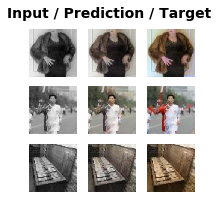

In [24]:
learn_gen.show_results(rows=3, imgsize=1)

## pretrain critic

In [19]:
name_gen = 'image_gen'
path_gen = path/'tiny-imagenet-200'/name_gen

In [20]:
def save_preds(dl):
    i=0
    names = dl.dataset.items
    
    for b in dl:
        preds = learn_gen.pred_batch(batch=b, reconstruct=True)
        for o in preds:
            o.save(path_gen/names[i].name)
            #print (path_gen/names[i].name)
            #print (i)
            i += 1
    
def save_gen_images(path_gen):
    if path_gen.exists(): shutil.rmtree(path_gen)
    path_gen.mkdir(exist_ok=True)
    data_gen = get_data(bs=bs, size=sz, keep_pct=0.5, colour_path=path_colour, crappy_path=path_crappy)
    save_preds(data_gen.fix_dl)
    PIL.Image.open(path_gen.ls()[0])

def get_crit_data(classes, bs, size):
    src = ImageList.from_folder(path/'tiny-imagenet-200', include=classes, recurse=True).split_by_rand_pct(0.1, seed=42)
    ll = src.label_from_folder(classes=classes)
    data = (ll.transform(get_transforms(max_zoom=2.), size=size)
           .databunch(bs=bs).normalize(imagenet_stats))
    data.c = 3
    return data

def colorize_crit_learner(
    data: ImageDataBunch,
    loss_critic=AdaptiveLoss(nn.BCEWithLogitsLoss()),
    nf: int = 256,
    opt_func = None,
) -> Learner:
    return Learner(
        data,
        gan_critic(nf=nf),
        metrics=accuracy_thresh_expand,
        loss_func=loss_critic,
        wd=1e-3,
        opt_func=opt_func,
    )

In [22]:
save_gen_images(path_gen)

KeyboardInterrupt: 

In [26]:
data_crit = get_crit_data([name_gen, 'real_img'], bs=bs, size=sz)

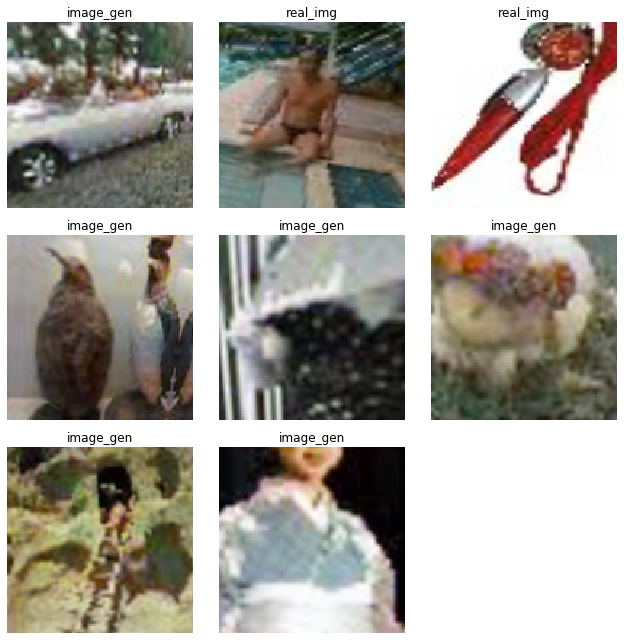

In [27]:
data_crit.show_batch(rows=3, ds_type=DatasetType.Train, imgsize=3)

In [26]:
#crit_learner = colorize_crit_learner(data_crit, nf=256, opt_func=opt_func)

In [27]:
#crit_learner.summary()

Sequential
Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [256, 64, 64]        12,544     True      
______________________________________________________________________
MishJit              [4096, 8, 8]         0          False     
______________________________________________________________________
Dropout2d            [256, 64, 64]        0          False     
______________________________________________________________________
Conv2d               [256, 64, 64]        590,080    True      
______________________________________________________________________
MishJit              [4096, 8, 8]         0          False     
______________________________________________________________________
Conv2d               [256, 64, 64]        590,080    True      
______________________________________________________________________
MishJit              [4096, 8, 8]         0          False     
___________________________________________________

In [21]:
gen_name = 'gen'
crit_name = 'crit'
old_checkpoint_num = 0
checkpoint_num = old_checkpoint_num + 1
gen_old_checkpoint_name = gen_name + '_' + str(old_checkpoint_num)
gen_new_checkpoint_name = gen_name + '_' + str(checkpoint_num)
crit_old_checkpoint_name = crit_name + '_' + str(old_checkpoint_num)
crit_new_checkpoint_name= crit_name + '_' + str(checkpoint_num)

In [22]:
bs=8
sz=128

In [23]:
wd = 1e-3
y_range = (-3.,3.)
opt_func = partial(Ranger)

learn_gen = unet_learner(data_gen, arch, wd=wd, blur=True, norm_type=NormType.Spectral,
                         self_attention=True, y_range=y_range, loss_func=feat_loss, opt_func=opt_func).load(gen_old_checkpoint_name, with_opt=False)

In [46]:
save_gen_images(path_gen)

In [27]:
if old_checkpoint_num == 0:
    bs=64
    sz=128
    learn_gen=None
    gc.collect()
    data_crit = get_crit_data([name_gen, 'real_img'], bs=bs, size=sz)
    data_crit.show_batch(rows=3, ds_type=DatasetType.Train, imgsize=3)
    learn_critic = colorize_crit_learner(data=data_crit, nf=256, opt_func=opt_func)
    learn_critic.callback_fns.append(partial(LearnerTensorboardWriter, base_dir=tboard_path, name='run1_crit'))
    learn_critic.fit_fc(6, 1e-3)
    learn_critic.save(crit_old_checkpoint_name)

In [47]:
data_crit = get_crit_data([name_gen, 'real_img'], bs=bs, size=sz)

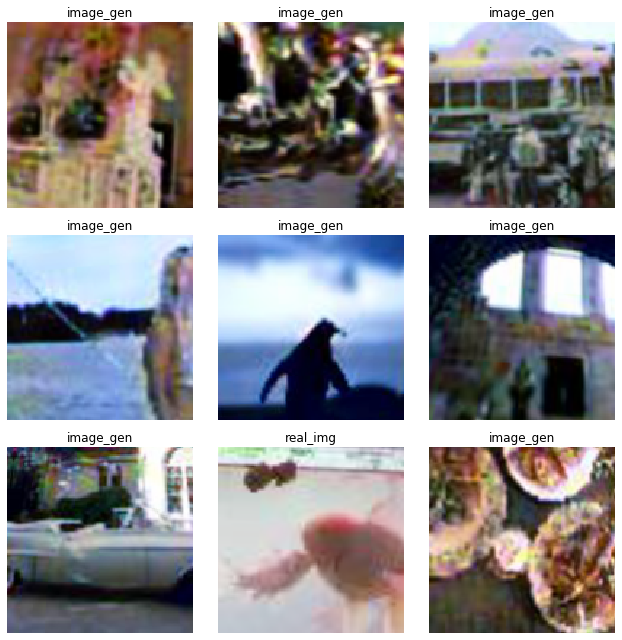

In [49]:
data_crit.show_batch(rows=3, ds_type=DatasetType.Train, imgsize=3)

In [50]:
opt_func = partial(Ranger)
learn_critic = colorize_crit_learner(data=data_crit, nf=256, opt_func=opt_func).load(crit_old_checkpoint_name)

set state called


In [51]:
learn_critic.callback_fns.append(partial(LearnerTensorboardWriter, base_dir=tboard_path, name=crit_new_checkpoint_name))

In [52]:
learn_critic.fit_fc(4, 1e-4)

epoch,train_loss,valid_loss,accuracy_thresh_expand,time
0,0.312799,0.249223,0.904509,28:18
1,0.164070,0.140203,0.952167,28:16
2,0.152763,0.102089,0.964705,28:14
3,0.121144,0.083021,0.973389,28:14


In [53]:
learn_critic.save(crit_new_checkpoint_name)

In [29]:
#opt_func = partial(Ranger)

## GAN

In [24]:
learn_crit=None
learn_gen=None
gc.collect()

20

In [25]:
lr=1e-5
sz=128
bs=8

In [26]:
data_crit = get_crit_data([name_gen, 'real_img'], bs=bs, size=sz)

In [27]:
opt_func = partial(Ranger)
learn_crit = colorize_crit_learner(data=data_crit, nf=256, opt_func=opt_func).load(crit_new_checkpoint_name, with_opt=False)

In [28]:
wd = 1e-3
y_range = (-3.,3.)
opt_func = partial(Ranger)

learn_gen = unet_learner(data_gen, arch, wd=wd, blur=True, norm_type=NormType.Spectral,
                         self_attention=True, y_range=y_range, loss_func=feat_loss, opt_func=opt_func)
learn_gen.load(gen_old_checkpoint_name, with_opt=False)

Learner(data=ImageDataBunch;

Train: LabelList (72000 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /home/jupyter/Colourize/tiny-imagenet-200/BW;

Valid: LabelList (8000 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /home/jupyter/Colourize/tiny-imagenet-200/BW;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1,

In [30]:
opt_func = partial(Ranger)
switcher = partial(AdaptiveGANSwitcher, critic_thresh=0.65)
learn = GANLearner.from_learners(learn_gen, learn_crit, weights_gen=(20.0,1.0), show_img=False, switcher=switcher,
                                 opt_func=opt_func, wd=1e-3)
learn.callback_fns.append(partial(GANDiscriminativeLR, mult_lr=5.))
learn.callback_fns.append(partial(GANTensorboardWriter, base_dir=tboard_path, name='GanLearner_'+str(checkpoint_num), visual_iters=100))
learn.callback_fns.append(partial(GANSaveCallback, learn_gen=learn_gen, filename=gen_new_checkpoint_name, save_iters=100))

In [72]:
#learn.save('test.pth')

In [31]:
learn.data = get_data(bs,size, colour_path=path_colour, crappy_path=path_crappy)
learn_gen.freeze_to(-1)
learn.fit(1,lr)

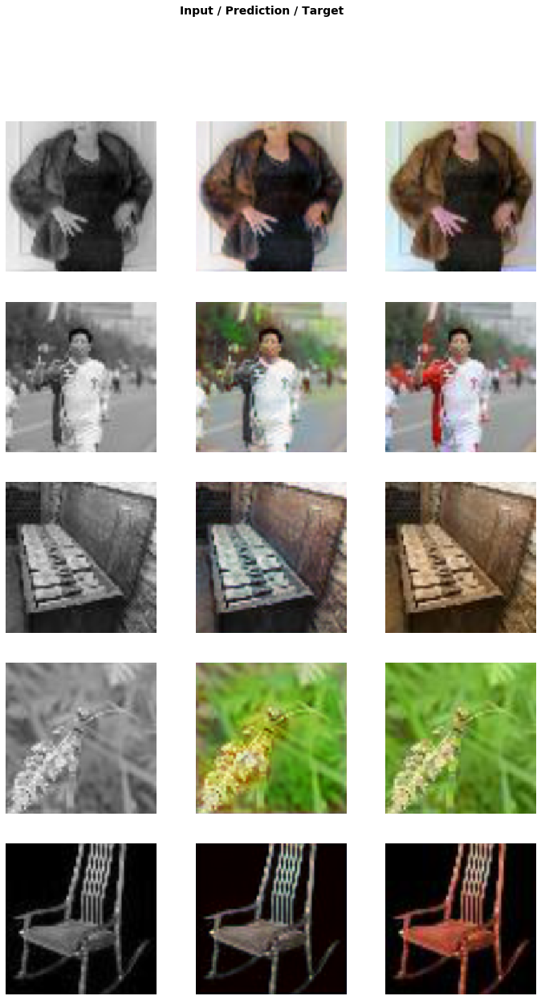

In [32]:
learn.show_results()

In [44]:
learn_crit.summary()

Sequential
Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [256, 64, 64]        12,544     True      
______________________________________________________________________
MishJit              [4096, 8, 8]         0          False     
______________________________________________________________________
Dropout2d            [256, 64, 64]        0          False     
______________________________________________________________________
Conv2d               [256, 64, 64]        590,080    True      
______________________________________________________________________
MishJit              [4096, 8, 8]         0          False     
______________________________________________________________________
Conv2d               [256, 64, 64]        590,080    True      
______________________________________________________________________
MishJit              [4096, 8, 8]         0          False     
___________________________________________________

## Test

In [27]:
wd = 1e-3
y_range = (-3.,3.)
opt_func = partial(Ranger)

test_model = 'gen_1'

learn_gen = unet_learner(data_gen, arch, wd=wd, blur=True, norm_type=NormType.Spectral,
                         self_attention=True, y_range=y_range, loss_func=feat_loss, opt_func=opt_func)
learn_gen.load(test_model, with_opt=False)

Learner(data=ImageDataBunch;

Train: LabelList (72000 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /home/jupyter/Colourize/tiny-imagenet-200/BW;

Valid: LabelList (8000 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /home/jupyter/Colourize/tiny-imagenet-200/BW;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1,

In [28]:
test_data = get_data(bs, size=(820,1024), colour_path=path_colour, crappy_path=path_crappy)

In [29]:
learn_gen.data = test_data

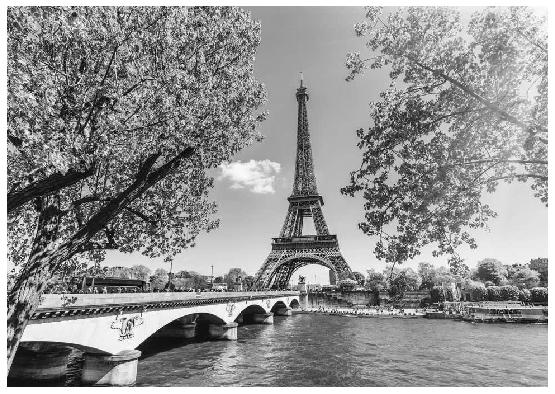

In [30]:
img = open_image('paris_bw.jpg')
img.show(figsize=(12,7))

In [31]:
img.shape

torch.Size([3, 681, 968])

In [32]:
_, img, _ = learn_gen.predict(img)
img.shape

torch.Size([3, 820, 1024])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


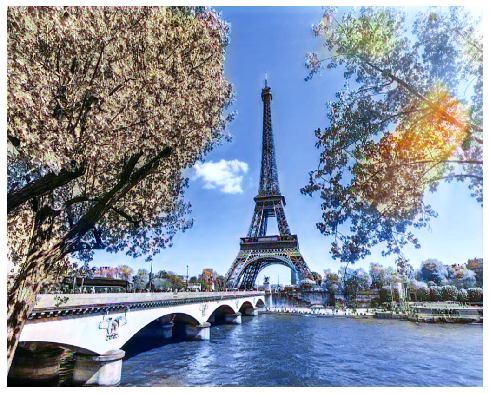

In [33]:
#extra feats
Image(img).show(figsize=(12,7))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


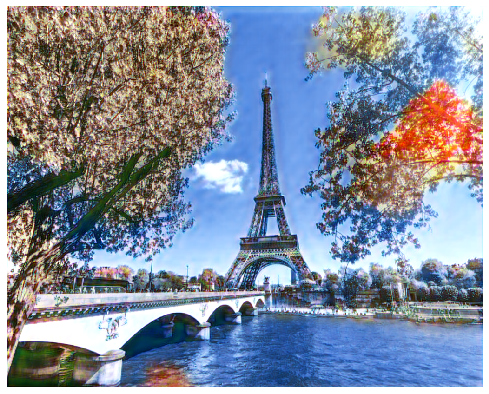

In [24]:
#extra feats
Image(img).show(figsize=(12,7))

In [25]:
i = Image(img)

In [26]:
i.save('paris_extra_feats.jpg')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


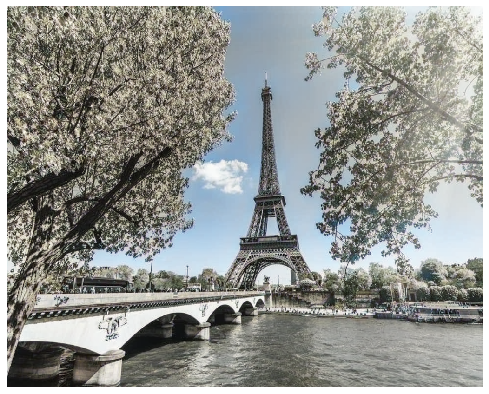

In [42]:
#simple unet
Image(img).show(figsize=(12,7))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


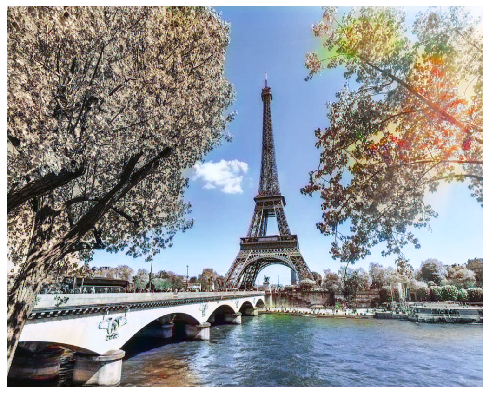

In [35]:
#momentum weights gen 1, 2
#round 2 last
Image(img).show(figsize=(12,7))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


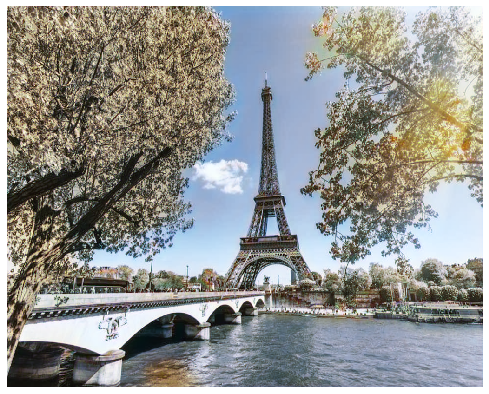

In [28]:
#momentum weights gen 1, 2
#round 1 last
Image(img).show(figsize=(12,7))

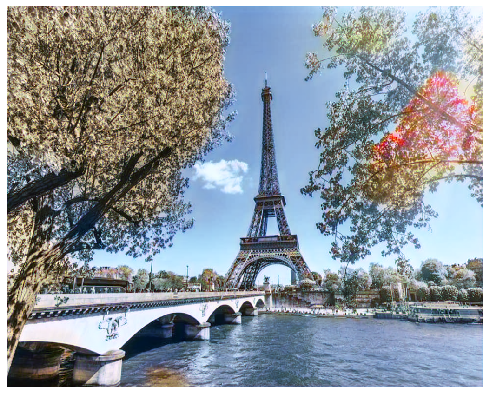

In [42]:
#no momentum weights gen 1, 2
Image(img).show(figsize=(12,7))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


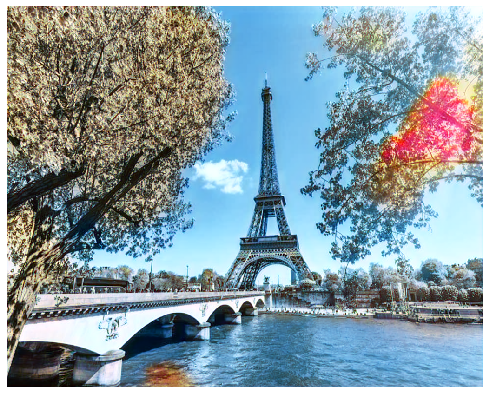

In [60]:
#momentum weights gen 1, 2
#round 2
Image(img).show(figsize=(12,7))

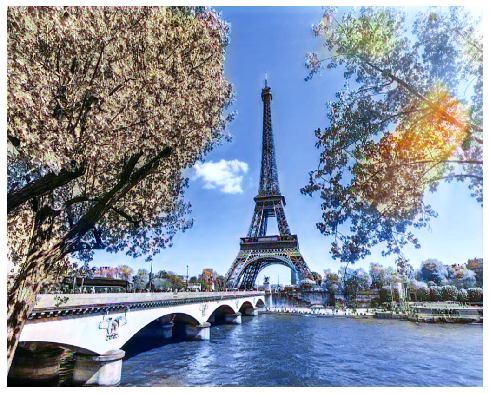

In [80]:
#momentum weights gen 1, 2
Image(img).show(figsize=(12,7))

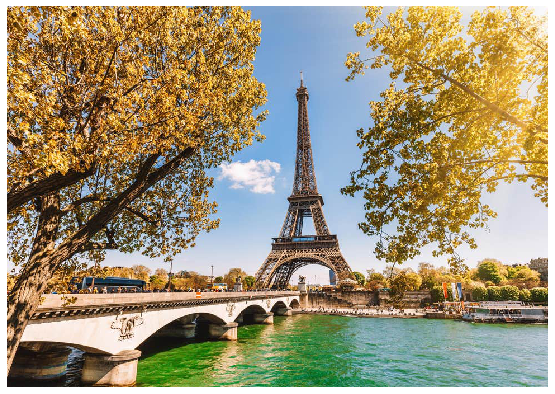

In [63]:
img = open_image('paris.jpg')
img.show(figsize=(12,7))

torch.Size([3, 1469, 2200])

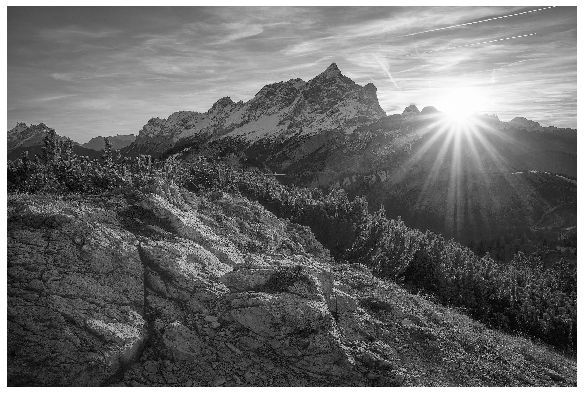

In [101]:
t = PIL.Image.open('nature.jpeg').convert('LA').convert('RGB')
t.save('tmp.jpeg')
img = open_image('tmp.jpeg')
img.show(figsize=(12,7))
img.shape

In [102]:
test_data = get_data(bs, size=(820,1024), colour_path=path_colour, crappy_path=path_crappy)
learn_gen.data = test_data

In [103]:
_, img, _ = learn_gen.predict(img)
img.shape

torch.Size([3, 820, 1024])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


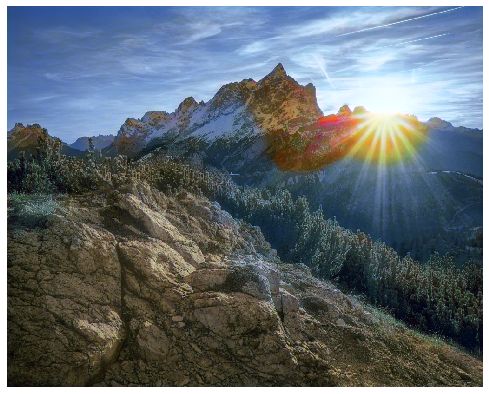

In [104]:
Image(img).show(figsize=(12,7))

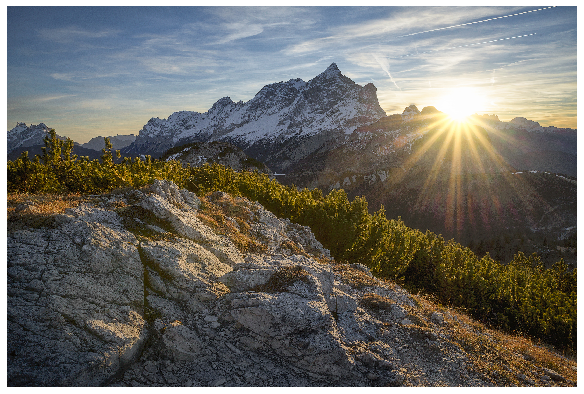

In [106]:
open_image('nature.jpeg').show(figsize=(12,7))

torch.Size([3, 253, 450])

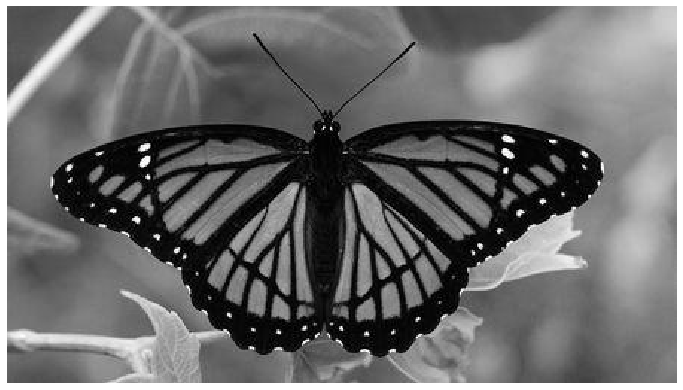

In [48]:
t = PIL.Image.open('butterfly.jpg').convert('LA').convert('RGB')
t.save('tmp.jpg')
img = open_image('tmp.jpg')
img.show(figsize=(12,7))
img.shape

In [49]:
test_data = get_data(bs, size=(240,450), colour_path=path_colour, crappy_path=path_crappy)
learn_gen.data = test_data

In [50]:
_, img, _ = learn_gen.predict(img)
img.shape

torch.Size([3, 240, 450])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


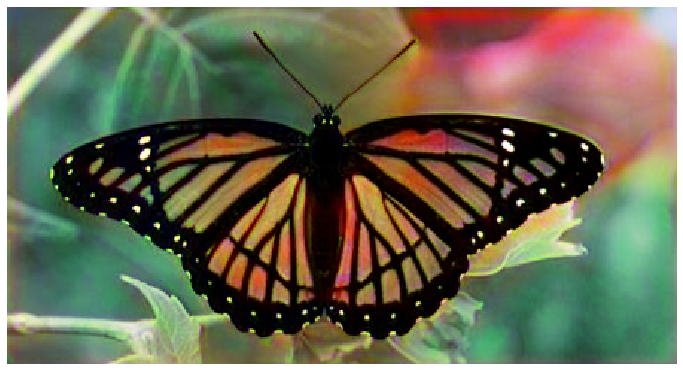

In [51]:
Image(img).show(figsize=(12,7))

torch.Size([3, 1016, 1280])

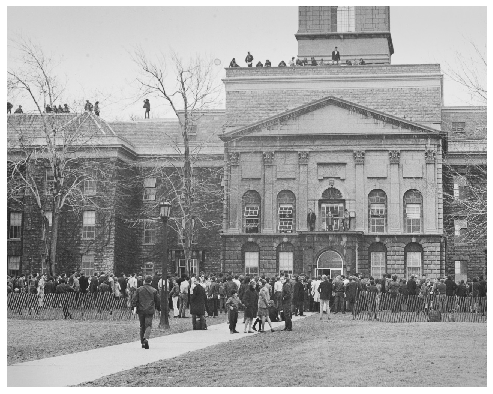

In [47]:
#t = PIL.Image.open('puppy-dog.jpg').convert('LA').convert('RGB')
#t.save('tmp.jpg')
img = open_image('UB.png')
img.show(figsize=(12,7))
img.shape

In [48]:
test_data = get_data(bs, size=(1000, 1280), colour_path=path_colour, crappy_path=path_crappy)
learn_gen.data = test_data

In [49]:
_, img, _ = learn_gen.predict(img)
img.shape

torch.Size([3, 1000, 1280])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


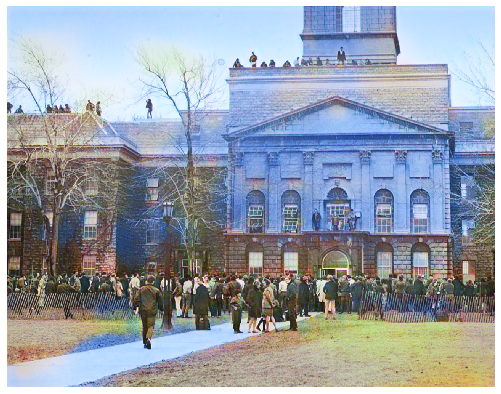

In [50]:
Image(img).show(figsize=(12,7))